In [ ]:
%pip install -r E:\sentiment-summarizer-project\requirements.txt

In [2]:
# EDA - Basic Analysis Notebook

import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\anish\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# Load data
df = pd.read_csv("../data/Reviews.csv")
print(f"Loaded {df.shape[0]} rows.")

Loaded 568454 rows.


In [4]:
# Clean data
df.dropna(inplace=True)
df = df[df['Score'].apply(lambda x: str(x).isdigit())]
df["Score"] = df["Score"].astype(int)
df = df[df["Score"] != 3].copy()
df["sentiment"] = df["Score"].apply(lambda s: "positive" if s > 3 else "negative")

In [5]:
# Sentiment distribution
fig = px.histogram(df, x="sentiment", color="sentiment", title="Sentiment Distribution")
fig.show()


In [6]:
# Review length analysis
df['review_length'] = df['Text'].apply(lambda x: len(str(x).split()))
fig = px.histogram(df, x="review_length", nbins=50, color="sentiment", title="Review Length Distribution")
fig.show()

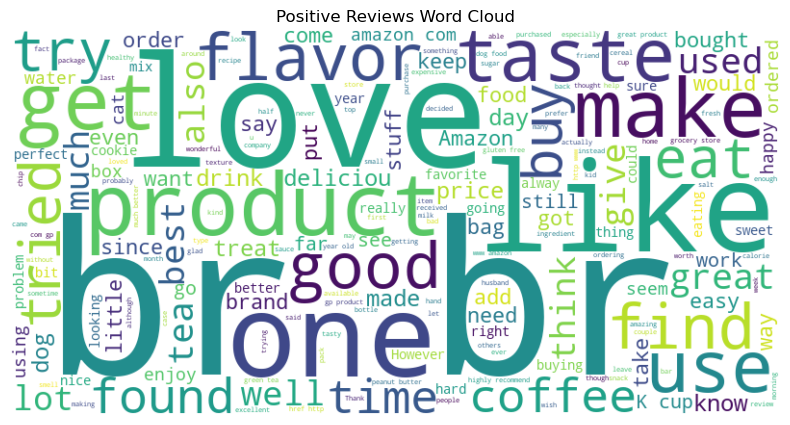

In [7]:
# Word Cloud Positive
text_positive = " ".join(df[df.sentiment == "positive"]["Text"].dropna())
stop_words = set(stopwords.words('english'))
wc_positive = WordCloud(width=800, height=400, stopwords=stop_words, background_color='white').generate(text_positive)

plt.figure(figsize=(10,5))
plt.imshow(wc_positive, interpolation="bilinear")
plt.axis('off')
plt.title("Positive Reviews Word Cloud")
plt.show()


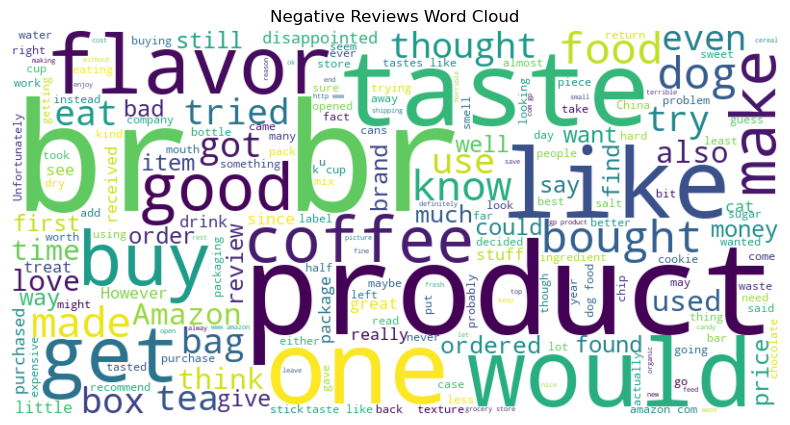

In [8]:
# Word Cloud Negative
text_negative = " ".join(df[df.sentiment == "negative"]["Text"].dropna())
wc_negative = WordCloud(width=800, height=400, stopwords=stop_words, background_color='white').generate(text_negative)

plt.figure(figsize=(10,5))
plt.imshow(wc_negative, interpolation="bilinear")
plt.axis('off')
plt.title("Negative Reviews Word Cloud")
plt.show()
